In [1]:
%matplotlib inline
import time
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchvision.utils import save_image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
seed = 6969
# seed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", seed)
random.seed(seed)
torch.manual_seed(seed)

Random Seed:  6969


In [2]:
# Root directory for dataset
dataroot = "/kaggle/input/animefacedataset/images/"

# Directory to store generated fake images
fake_image_save_path = '/kaggle/working/BaselineModel_GAN/'

# Data Normalization Setting
normalize_mean = (0.5, 0.5, 0.5)
normalize_std = (0.5, 0.5, 0.5)

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 50 # Original is 5 on a dataset of 1 million

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [3]:
# Resize Images to same dimension to facilitate Evaluation
from genericpath import isdir
from PIL import Image
import os, sys

raw_data_path = dataroot
processed_data_path = "/kaggle/working/Processed/images/"
raw_images = os.listdir(raw_data_path) # This line intermittently causes failure due to huge number of Files. Retry multiple times and it will eventually pass.
raw_images = raw_images[:15000]
print('Number of Raw Images in Input Data:',len(raw_images))
if not os.path.isdir(processed_data_path):
  os.makedirs(processed_data_path)
processed_images = set(os.listdir(processed_data_path))
print('Number of Pre-processed Images in Input Data:',len(processed_images))
# COMMENT NOTE: Instead of deleting them, we're instead going to skip processing them
# elif len(os.listdir(raw_data_path))!=len(os.listdir(processed_data_path)):
#   # Delete all Processed Files if some are missing
#   for root, dirs, files in os.walk(processed_data_path, topdown=False):
#     for file in files:
#         os.remove(os.path.join(root, file))
#     for dir in dirs:
#         os.rmdir(os.path.join(root, dir))

# If all files already exist, do not run it again
if len(raw_images)!=len(processed_images):
  image_index = 0
  for image in raw_images:
    image_path = os.path.join(raw_data_path, image)
    image_save_path = os.path.join(processed_data_path, image)
    if len(image.split("."))<2 or (image.split(".")[1] not in ["jpg", "png"]) or (image in processed_images):
        continue
    if os.path.exists(image_path):
        im = Image.open(image_path)
        image_resized = im.resize((image_size,image_size))
        image_resized.save(image_save_path, quality=100)
    if image_index%500==0:
      print(f'Processed {image_index} images')
    image_index+=1
  print('Images Resized and Saved')

Number of Raw Images in Input Data: 15000
Number of Pre-processed Images in Input Data: 0
Processed 0 images
Processed 500 images
Processed 1000 images
Processed 1500 images
Processed 2000 images
Processed 2500 images
Processed 3000 images
Processed 3500 images
Processed 4000 images
Processed 4500 images
Processed 5000 images
Processed 5500 images
Processed 6000 images
Processed 6500 images
Processed 7000 images
Processed 7500 images
Processed 8000 images
Processed 8500 images
Processed 9000 images
Processed 9500 images
Processed 10000 images
Processed 10500 images
Processed 11000 images
Processed 11500 images
Processed 12000 images
Processed 12500 images
Processed 13000 images
Processed 13500 images
Processed 14000 images
Processed 14500 images
Images Resized and Saved


In [4]:
# UnNormalize Class allows us to reverse the data processing, get the original image tensor back to write to a file

class UnNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be normalized.
        Returns:
            Tensor: Normalized image.
        """
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor

unorm = UnNormalize(mean=normalize_mean, std=normalize_std)

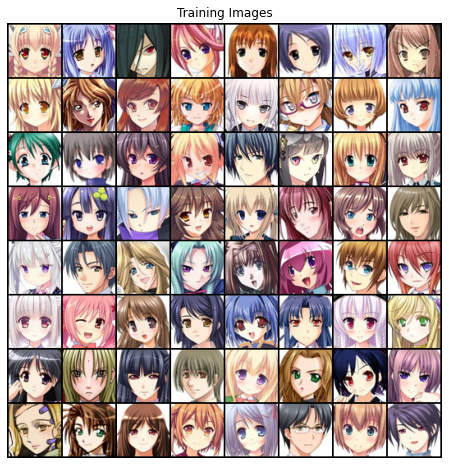

In [5]:
# Create the dataset [Intermittently fails because of large number of Files. Retry until it succeeds.]
dataroot = '/kaggle/working/Processed/' # TEMP
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize(normalize_mean, normalize_std),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [6]:
# Custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [7]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.Upsample(4),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.Upsample(8),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(16),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [8]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Upsample(size=4, mode=nearest)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): Upsample(size=8, mode=nearest)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Upsample(size=16, mode=nearest)
    (10): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (11): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): LeakyReLU(negative_slope=0.2, inplace=True)
   

In [9]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [10]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Dropout2d(p=0.25, inplace=False)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Dropout2d(p=0.25, inplace=False)
    (7): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (8): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
    (10): Dropout2d(p=0.25, inplace=False)
    (11): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (12): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): LeakyReLU(negative_slope=0.2, inplace=True)

In [11]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [12]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
total_train_start_time = time.time()
# For each epoch
for epoch in range(num_epochs):
  epoch_start_time = time.time()
  # For each batch in the dataloader
  for i, data in enumerate(dataloader, 0): # First Epoch DataLoader takes long, as it caches the entire dataset
    ############################
    # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
    ###########################
    ## Train with all-real batch
    netD.zero_grad()
    # Format batch
    real_cpu = data[0].to(device)
    b_size = real_cpu.size(0)
    label = torch.full((b_size,), real_label, device=device, dtype=torch.float)
    # Forward pass real batch through D
    output = netD(real_cpu).view(-1)
    # Calculate loss on all-real batch
    errD_real = criterion(output, label)
    # Calculate gradients for D in backward pass
    errD_real.backward()
    D_x = output.mean().item()

    ## Train with all-fake batch
    # Generate batch of latent vectors
    noise = torch.randn(b_size, nz, 1, 1, device=device)
    # Generate fake image batch with G
    fake = netG(noise)
    label.fill_(fake_label)
    # Classify all fake batch with D
    output = netD(fake.detach()).view(-1)
    # Calculate D's loss on the all-fake batch
    errD_fake = criterion(output, label)
    # Calculate the gradients for this batch
    errD_fake.backward()
    D_G_z1 = output.mean().item()
    # Add the gradients from the all-real and all-fake batches
    errD = errD_real + errD_fake
    # Update D
    optimizerD.step()

    ############################
    # (2) Update G network: maximize log(D(G(z)))
    ###########################
    netG.zero_grad()
    label.fill_(real_label)  # fake labels are real for generator cost
    # Since we just updated D, perform another forward pass of all-fake batch through D
    output = netD(fake).view(-1)
    # Calculate G's loss based on this output
    errG = criterion(output, label)
    # Calculate gradients for G
    errG.backward()
    D_G_z2 = output.mean().item()
    # Update G
    optimizerG.step()

    # Output training stats
    if i % 1000 == 0:
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
              % (epoch, num_epochs, i, len(dataloader),
                  errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

    # Save Losses for plotting later
    G_losses.append(errG.item())
    D_losses.append(errD.item())

    # Check how the generator is doing by saving G's output on fixed_noise
    if (iters % 250 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
        with torch.no_grad():
            fake = netG(fixed_noise).detach().cpu()
        img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
    iters += 1
  print(f'Epoch {epoch} took: {time.time()-epoch_start_time} seconds\n')

print(f'\n\n Model Training for {num_epochs} epochs took: {time.time()-total_train_start_time} seconds')

Starting Training Loop...
[0/50][0/118]	Loss_D: 1.7772	Loss_G: 1.3285	D(x): 0.4929	D(G(z)): 0.5086 / 0.3588
Epoch 0 took: 19.808939218521118 seconds

[1/50][0/118]	Loss_D: 0.7370	Loss_G: 4.8299	D(x): 0.9089	D(G(z)): 0.3221 / 0.0465
Epoch 1 took: 14.267444133758545 seconds

[2/50][0/118]	Loss_D: 0.8351	Loss_G: 4.2751	D(x): 0.8531	D(G(z)): 0.3437 / 0.0348
Epoch 2 took: 14.978522300720215 seconds

[3/50][0/118]	Loss_D: 0.8634	Loss_G: 1.7399	D(x): 0.7048	D(G(z)): 0.2382 / 0.2954
Epoch 3 took: 14.366397619247437 seconds

[4/50][0/118]	Loss_D: 1.0507	Loss_G: 1.5833	D(x): 0.5104	D(G(z)): 0.1329 / 0.3129
Epoch 4 took: 15.024811506271362 seconds

[5/50][0/118]	Loss_D: 2.3892	Loss_G: 3.1625	D(x): 0.9391	D(G(z)): 0.7935 / 0.0875
Epoch 5 took: 14.426970720291138 seconds

[6/50][0/118]	Loss_D: 0.7157	Loss_G: 1.8544	D(x): 0.7181	D(G(z)): 0.2387 / 0.2503
Epoch 6 took: 14.725441932678223 seconds

[7/50][0/118]	Loss_D: 0.4410	Loss_G: 2.4857	D(x): 0.7862	D(G(z)): 0.1155 / 0.1429
Epoch 7 took: 14.1346464

In [13]:
import os
os.mkdir('/kaggle/working/CSE598_GroupProject_BaselineModel_GAN/')
os.chdir("/kaggle/working/CSE598_GroupProject_BaselineModel_GAN/")
!ls

In [14]:
# Save both Discriminator & Generator Model
discriminator_model_path = '/kaggle/working/CSE598_GroupProject_BaselineModel_GAN/discriminator.pt'
torch.save(netD, discriminator_model_path)
generator_model_path = '/kaggle/working/CSE598_GroupProject_BaselineModel_GAN/generator.pt'
torch.save(netG, generator_model_path)

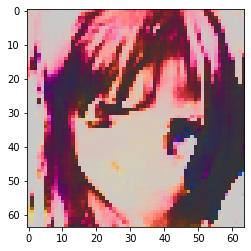

In [15]:
# Test the Loaded Model performance by generating a Fake Image
loaded_generator_model = torch.load(generator_model_path)
fake = torch.nn.functional.normalize(loaded_generator_model(fixed_noise).detach().cpu())
# plt.imshow(np.transpose(fake[0],(1,2,0)))
plt.imshow(np.transpose(unorm(fake[0]),(1,2,0)))

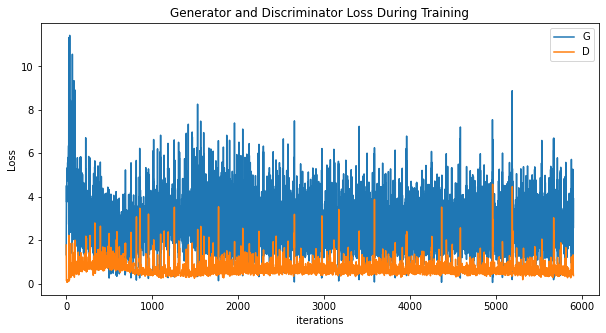

In [16]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

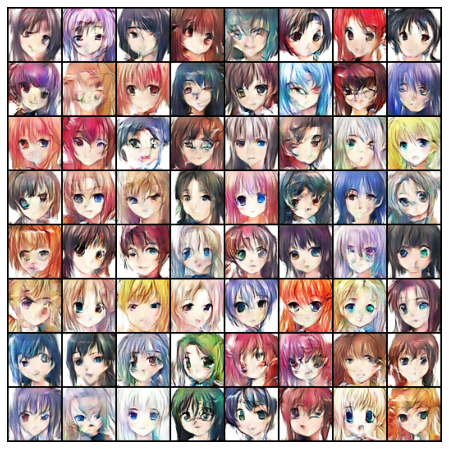

In [17]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

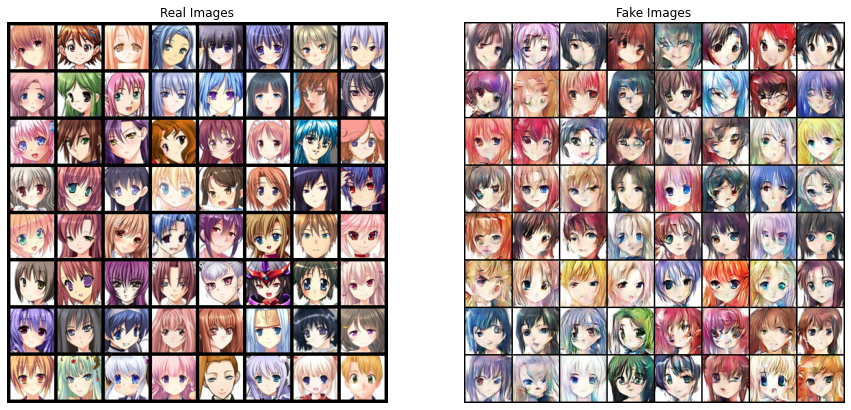

In [18]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [19]:
# Store the Fake Images for Evaluating with Real Images
import shutil

if os.path.isdir(fake_image_save_path):
  shutil.rmtree(fake_image_save_path)
os.makedirs(fake_image_save_path)

fake_images = fake # img_list[-1]
for i in range(len(fake_images)):
  save_image(unorm(fake_images[i]), fake_image_save_path+f'fake_image_{i}.jpeg')

In [20]:
# Evaluating Fake & Real Images
!pip install pytorch-fid
# !python -m pytorch_fid "drive/MyDrive/Colab Datasets/AnimeFacesDataset/" "drive/MyDrive/Colab Datasets/AnimeFacesDataset/"
print('\n\nComputing the FID Score for the Model:')
!python -m pytorch_fid '/kaggle/working/Processed/images/' '/kaggle/working/BaselineModel_GAN/'

  Preparing metadata (setup.py) ... done
  Created wheel for pytorch-fid: filename=pytorch_fid-0.2.1-py3-none-any.whl size=14835 sha256=c2b19b6e9dea5d0c6afa84f0fa7be13a1cd02e2a5a3fd4d95ec5264cf17c6607
  Stored in directory: /root/.cache/pip/wheels/24/ac/03/c5634775c8a64f702343ef5923278f8d3bb8c651debc4a6890
Successfully built pytorch-fid


Computing the FID Score for the Model:
Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100%|███████████████████████████████████████| 91.2M/91.2M [00:00<00:00, 258MB/s]
100%|█████████████████████████████████████████████| 2/2 [00:00<00:00,  7.45it/s]
FID:  193.680810331626
